<a href="https://colab.research.google.com/github/benrajukoshy/Montagesimulation/blob/main/toolwear.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import shutil
import os

directory_to_delete = '/content/ROI_images'

# Check if the directory exists
if os.path.exists(directory_to_delete):
    # Remove the directory and its contents
    shutil.rmtree(directory_to_delete)
    print(f"Directory '{directory_to_delete}' and its contents have been deleted.")
else:
    print(f"Directory '{directory_to_delete}' does not exist.")


Directory '/content/ROI_images' does not exist.


In [2]:
# loading the necessary libraries
import numpy as np
import os
import random
import cv2
import PIL.Image as Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub
from keras.utils import to_categorical
from google.colab.patches import cv2_imshow
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img
from sklearn.model_selection import train_test_split

# Load and preprocess the data
import pandas as pd
import random
from urllib.request import urlopen, urlretrieve
from PIL import Image
from tqdm import tqdm_notebook
from sklearn.utils import shuffle
import cv2
from sklearn.metrics import precision_recall_curve

# Import the pre-trained models
from tensorflow.keras.applications import ResNet50, MobileNetV2

# Define callbacks and training parameters
from keras.callbacks import TensorBoard, ReduceLROnPlateau, ModelCheckpoint

# Build the model
from keras.models import Sequential, Model, load_model
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D,GlobalAveragePooling2D


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
#Initalising the cropping parameters
roi_x1 = 1
roi_y1 = 430
roi_x2 = 1600
roi_y2 = 830

In [5]:
filename = "S14.jpg"
filename = filename.split("S")[1]
filename = filename.split(".")[0]
print(filename)

14


In [6]:
# Define the directory containing the images and the output directory
image_directory = "/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Trainingsdaten"
output_directory = "/content/ROI_images"
os.makedirs(output_directory, exist_ok=True)
class_data = pd.read_csv(f'{image_directory}/input.csv')
print(class_data.head())


def create_roi(image_path, output_directory, class_names):
    # Read the image
    image = cv2.imread(image_path)

    # Crop the image to the specified ROI
    roi = image[roi_y1:roi_y2, roi_x1:roi_x2]

    # Create a subdirectory for the class
    class_directory = os.path.join(output_directory, class_names)
    os.makedirs(class_directory, exist_ok=True)

    # Get the filename without the path
    filename = os.path.basename(image_path)

    # Save the ROI image in the class-specific directory
    output_path = os.path.join(class_directory, filename)
    cv2.imwrite(output_path, roi)

# Process each image in the dataset
#for class_names in os.listdir(image_directory):
    #class_directory = os.path.join(image_directory, class_names)
    #print(class_directory)
if os.path.isdir(image_directory):
    for filename in os.listdir(image_directory):
        if filename.endswith(".jpg"):
            class_id = filename.split("S")[1]
            class_id = class_id.split(".")[0]
            #class_name = class_data.loc[class_data['Klasse'] == class_id].iloc[0]
            class_name = class_data.loc[class_data['Schneide']==int(class_id),'Klasse'].item()
            print(class_id,class_name)
            image_path = os.path.join(image_directory, filename)
            create_roi(image_path, output_directory, class_name)

   Schneide   Vb Testdatensatz     Klasse                     type
0        39  156           NaN  Neuwertig  Schneidecke grenzwertig
1        89  321           NaN     Mittel  Schneidecke degeneriert
2        97  101             x  Neuwertig       Schneidecke intakt
3       148  184           NaN  Neuwertig       Schneidecke intakt
4         9  252           NaN     Mittel  Schneidecke grenzwertig
1 Defekt
101 Defekt
103 Defekt
110 Defekt
106 Defekt
111 Mittel
109 Mittel
11 Defekt
107 Defekt
104 Mittel
108 Defekt
112 Defekt
102 Defekt
100 Defekt
10 Defekt
105 Mittel
113 Defekt
12 Defekt
35 Defekt
133 Mittel
123 Defekt
134 Mittel
139 Defekt
25 Mittel
124 Defekt
117 Defekt
24 Defekt
142 Defekt
144 Mittel
119 Defekt
147 Mittel
17 Defekt
30 Defekt
20 Defekt
40 Mittel
26 Defekt
143 Mittel
116 Mittel
140 Mittel
21 Defekt
16 Defekt
32 Defekt
138 Defekt
131 Mittel
126 Defekt
118 Defekt
137 Defekt
29 Defekt
2 Defekt
36 Defekt
132 Defekt
13 Defekt
34 Mittel
23 Defekt
141 Mittel
3 Defekt
130 Def

In [75]:
# Define the directory containing the images and the output directory
image_directory = "/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Testdatensatz"
output_directory = "/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/DATA/Test"
os.makedirs(output_directory, exist_ok=True)
class_data = pd.read_csv("/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Trainingsdaten/input.csv")
print(class_data.head())


def create_roi(image_path, output_directory, class_names):
    # Read the image
    image = cv2.imread(image_path)

    # Crop the image to the specified ROI
    roi = image[roi_y1:roi_y2, roi_x1:roi_x2]

    # Create a subdirectory for the class
    class_directory = os.path.join(output_directory, class_names)
    os.makedirs(class_directory, exist_ok=True)

    # Get the filename without the path
    filename = os.path.basename(image_path)

    # Save the ROI image in the class-specific directory
    output_path = os.path.join(class_directory, filename)
    cv2.imwrite(output_path, roi)

# Process each image in the dataset
#for class_names in os.listdir(image_directory):
    #class_directory = os.path.join(image_directory, class_names)
    #print(class_directory)
if os.path.isdir(image_directory):
    for filename in os.listdir(image_directory):
        if filename.endswith(".jpg"):
            class_id = filename.split("S")[1]
            class_id = class_id.split(".")[0]
            #class_name = class_data.loc[class_data['Klasse'] == class_id].iloc[0]
            class_name = class_data.loc[class_data['Schneide']==int(class_id),'Klasse'].item()
            print(class_id,class_name)
            image_path = os.path.join(image_directory, filename)
            create_roi(image_path, output_directory, class_name)

   Schneide   Vb Testdatensatz     Klasse                     type
0        39  156           NaN  Neuwertig  Schneidecke grenzwertig
1        89  321           NaN     Mittel  Schneidecke degeneriert
2        97  101             x  Neuwertig       Schneidecke intakt
3       148  184           NaN  Neuwertig       Schneidecke intakt
4         9  252           NaN     Mittel  Schneidecke grenzwertig
56 Defekt
33 Defekt
4 Defekt
127 Mittel
52 Defekt
97 Neuwertig
65 Mittel
135 Mittel
77 Defekt
128 Defekt


Class Name: Neuwertig
Image Path: /content/ROI_images/Neuwertig/S148.jpg
Image Size: 181.49 KB
Image Shape: (400, 1599, 3)


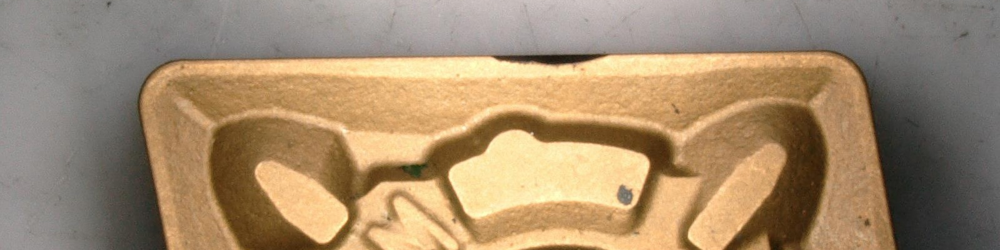

In [7]:
# Define the directory containing the cropped ROI images
cropped_images_directory = "/content/ROI_images"

def display_random_image(images_directory):
    class_names = os.listdir(images_directory)
    random_class = random.choice(class_names)

    class_directory = os.path.join(images_directory, random_class)
    random_image = random.choice([f for f in os.listdir(class_directory) if f.endswith(".jpg")])
    image_path = os.path.join(class_directory, random_image)

    image = cv2.imread(image_path)

    size = os.path.getsize(image_path) / 1024  # Size in KB
    shape = image.shape

    print(f"Class Name: {random_class}")
    print(f"Image Path: {image_path}")
    print(f"Image Size: {size:.2f} KB")
    print(f"Image Shape: {shape}")

    cv2_imshow(image)

# Display information for a random cropped image
display_random_image(cropped_images_directory)

Class Name: Mittel
Image Path: /content/ROI_images/Mittel/S134.jpg
Image Size: 182.46 KB
Image Shape: (400, 1599, 3)


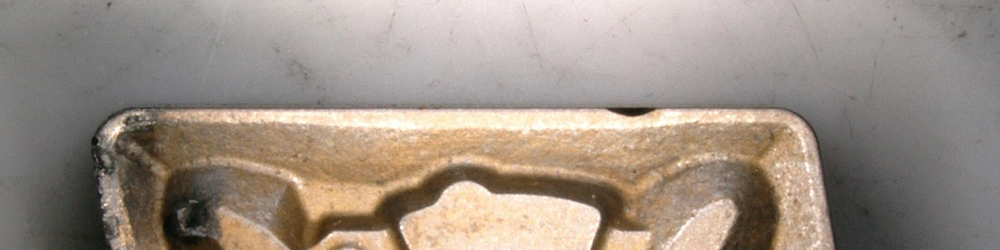

In [8]:
import os
import random
import cv2
from google.colab.patches import cv2_imshow  # Required for displaying images in Google Colab

# Define the directory containing the cropped ROI images
cropped_images_directory = "/content/ROI_images"

def display_random_image(images_directory):
    class_names = os.listdir(images_directory)

    if not class_names:
        print("Error: No class directories found in the specified directory.")
        return

    random_class = random.choice(class_names)

    class_directory = os.path.join(images_directory, random_class)
    image_files = [f for f in os.listdir(class_directory) if f.endswith(".jpg")]

    if not image_files:
        print(f"Error: No images found in {class_directory}.")
        return

    random_image = random.choice(image_files)
    image_path = os.path.join(class_directory, random_image)

    image = cv2.imread(image_path)

    size = os.path.getsize(image_path) / 1024  # Size in KB
    shape = image.shape

    print(f"Class Name: {random_class}")
    print(f"Image Path: {image_path}")
    print(f"Image Size: {size:.2f} KB")
    print(f"Image Shape: {shape}")

    cv2_imshow(image)

# Display information for a random cropped image
display_random_image(cropped_images_directory)


In [10]:
# Define the desired image shape
IMAGE_SHAPE = (224, 224)

# Set the batch size for data processing during training
BATCH_SIZE = 32

In [11]:
# Create an ImageDataGenerator for data augmentation

image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255,)


# Define the path to your training data directory
training_data = "/content/ROI_images"

# Create separate data generators for training and validation
train_data_generator = image_generator.flow_from_directory(
    os.path.join(training_data),
    target_size=IMAGE_SHAPE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)


Found 135 images belonging to 3 classes.


In [12]:
total_images = train_data_generator.samples
print(f"Total number of images: {total_images}")

Total number of images: 135


In [13]:
# Get a batch of data from the generator
image_batch, label_batch = next(train_data_generator)

# image_batch: A batch of images
# label_batch: A batch of labels

# to can print the shapes of the batches to verify
print("Image batch shape:", image_batch.shape)
print("Label batch shape:", label_batch.shape)

Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 3)


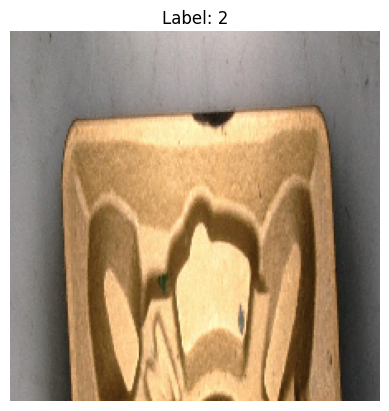

In [14]:
# Select a random index within the batch
index_to_display = random.randint(0, len(train_data_generator) - 1)

# Retrieve the selected image batch and label batch from the generator
selected_image_batch, selected_label_batch = train_data_generator[index_to_display]

# Extract a single image from the batch (assuming batch size is 1)
selected_image = selected_image_batch[0]

# Extract the corresponding label index (assuming batch size is 1)
selected_label_index = np.argmax(selected_label_batch[0])  # Convert one-hot to index

# Map the label index to the class name
selected_label = selected_label_index

# Display the image and label
plt.imshow(selected_image)
plt.title(f"Label: {selected_label}")
plt.axis('off')
plt.show()



Class: Mittel


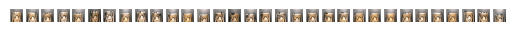

Class: Defekt


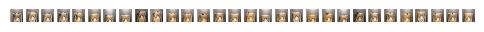

Class: Neuwertig


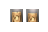

In [18]:
# Define the class names (categories) associated with your data
class_names = ['Mittel', 'Defekt', 'Neuwertig']
# Define the number of examples to display per class
examples_per_class = 32  # You can adjust this number as needed

# Create a dictionary to store images for each class
class_images = {class_name: [] for class_name in class_names}

# Iterate through the data generator to collect images for each class
for i in range(len(train_data_generator)):
    image_batch, label_batch = train_data_generator[i]
    for j in range(len(label_batch)):
        label_index = np.argmax(label_batch[j])
        class_name = class_names[label_index]
        if len(class_images[class_name]) < examples_per_class:
            class_images[class_name].append(image_batch[j])

# Display examples from each class
for class_name, images in class_images.items():
    print(f"Class: {class_name}")
    for i, image in enumerate(images):
        plt.subplot(len(class_names), examples_per_class, i + 1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()

In [19]:
# Create a dictionary to store the counts for each class
class_counts = {class_name: 0 for class_name in class_names}

# Iterate through the data generator to count the images per class
for i in range(len(train_data_generator)):
    _, label_batch = train_data_generator[i]
    for j in range(len(label_batch)):
        label_index = np.argmax(label_batch[j])
        class_name = class_names[label_index]
        class_counts[class_name] += 1

# Print the total number of images in each class
for class_name, count in class_counts.items():
    print(f"Class: {class_name}, Total Images: {count}")

Class: Mittel, Total Images: 103
Class: Defekt, Total Images: 30
Class: Neuwertig, Total Images: 2


In [20]:
# Define the number of batches to consider for splitting
num_batches = len(train_data_generator)

# Initialize empty lists to store images and labels
images = []
labels = []

# Load all batches from the generator into lists
for _ in range(num_batches):
    image_batch, label_batch = next(train_data_generator)
    images.append(image_batch)
    labels.append(label_batch)

# Convert the lists to NumPy arrays
X = np.vstack(images)
y = np.vstack(labels)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the sizes of the training and test sets
print(f"Training set size: {len(X_train)} images")
print(f"Test set size: {len(X_test)} images")

Training set size: 108 images
Test set size: 27 images


In [22]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(108, 224, 224, 3)
(27, 224, 224, 3)
(108, 3)
(27, 3)


In [23]:
feature_extractor_model = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"
feature_extractor = hub.KerasLayer(feature_extractor_model, input_shape=(224, 224, 3), trainable=False)
model = tf.keras.Sequential([feature_extractor])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
Total params: 2257984 (8.61 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [24]:
MobileNetV2=tf.keras.applications.mobilenet_v2.MobileNetV2
model_arch=MobileNetV2()
model_arch.summary()

14536120/14536120 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (R

In [25]:
model_1 = tf.keras.Sequential([feature_extractor ])
model_1.add(tf.keras.layers.Dense(3, activation='softmax'))
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 3)                 3843      
                                                                 
Total params: 2261827 (8.63 MB)
Trainable params: 3843 (15.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [26]:
model_1.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'] )

In [27]:
# Define the number of training epochs
epochs = 25

# Train the model using training data and validation data
history_1 = model_1.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test))

Epoch 1/25
4/4 [==============================] - 10s 1s/step - loss: 0.7730 - accuracy: 0.5833 - val_loss: 0.9434 - val_accuracy: 0.7037
Epoch 2/25
4/4 [==============================] - 4s 905ms/step - loss: 0.6851 - accuracy: 0.8056 - val_loss: 1.0117 - val_accuracy: 0.7037
Epoch 3/25
4/4 [==============================] - 6s 2s/step - loss: 0.5813 - accuracy: 0.8056 - val_loss: 0.6886 - val_accuracy: 0.7037
Epoch 4/25
4/4 [==============================] - 11s 2s/step - loss: 0.4569 - accuracy: 0.8056 - val_loss: 0.6509 - val_accuracy: 0.7037
Epoch 5/25
4/4 [==============================] - 6s 2s/step - loss: 0.4864 - accuracy: 0.8241 - val_loss: 0.5835 - val_accuracy: 0.6667
Epoch 6/25
4/4 [==============================] - 4s 1s/step - loss: 0.3898 - accuracy: 0.8519 - val_loss: 0.5910 - val_accuracy: 0.7037
Epoch 7/25
4/4 [==============================] - 4s 935ms/step - loss: 0.3766 - accuracy: 0.8241 - val_loss: 0.5877 - val_accuracy: 0.7037
Epoch 8/25
4/4 [=================

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


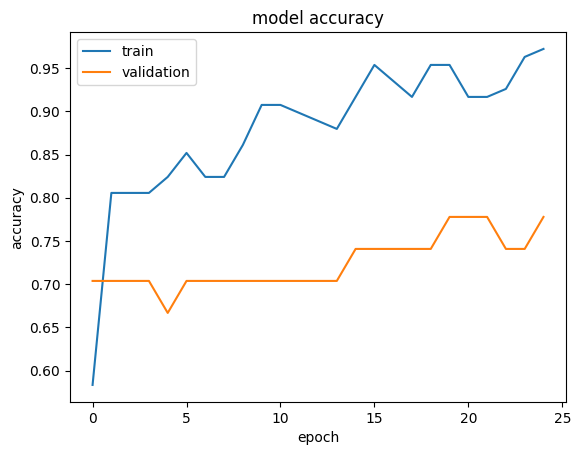

In [28]:
print(history_1.history.keys())
# summarize history for accuracy
plt.plot(history_1.history['accuracy'])  # Change 'acc' to 'accuracy'
plt.plot(history_1.history['val_accuracy'])  # Change 'val_acc' to 'val_accuracy'
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


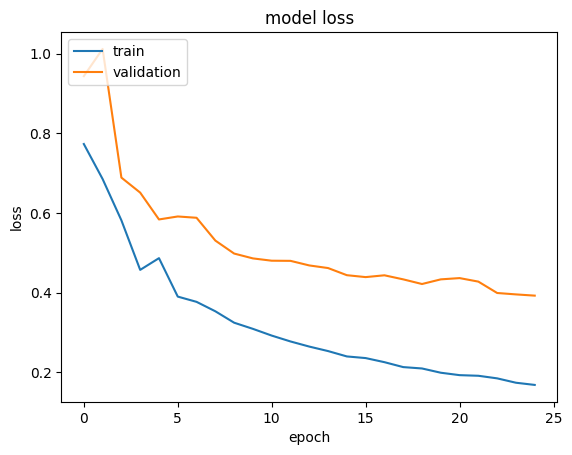

In [29]:
# summarize history for loss
plt.plot(history_1.history['loss'])
plt.plot(history_1.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [30]:
# Make predictions using the model
predicted_batch1 = model_1.predict(X_train)

# Find the predicted class indices
predicted_id1 = np.argmax(predicted_batch1, axis=-1)

# Map predicted class indices to class labels
predicted_label_batch1 = [class_names[i] for i in predicted_id1]

# Find the true class indices (ground truth)
true_id1 = np.argmax(y_train, axis=-1)

# Map true class indices to true class labels
true_label_batch1 = [class_names[i] for i in true_id1]

# Now you can print the predicted and true labels for the batch
print("Predicted Labels:", predicted_label_batch1)
print("True Labels:", true_label_batch1)

4/4 [==============================] - 10s 2s/step
Predicted Labels: ['Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Defekt', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Defekt', 'Mittel', 'Defekt', 'Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Defekt', 'Defekt', 'Mittel', 'Mittel', 'Mittel', 'Mit

In [31]:
#Function to plot an image
def plotImages(images1):
    fig, axes = plt.subplots(1, 10, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images1, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

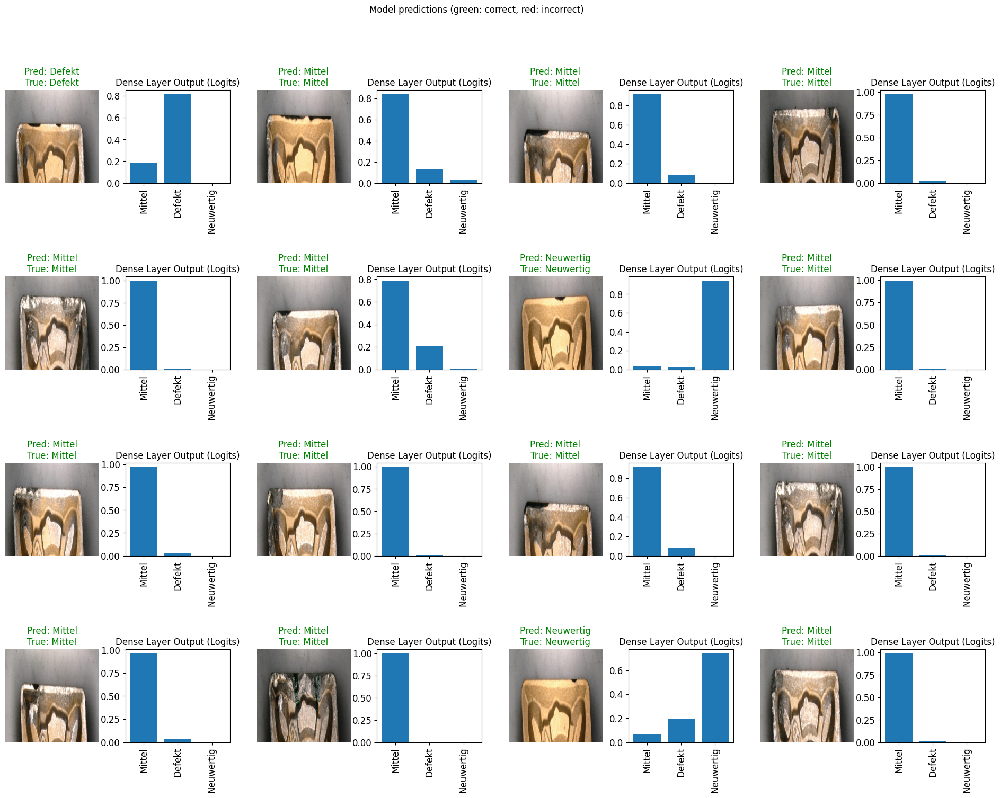

In [32]:
img_counter=0
prob_counter=0

plt.figure(figsize=(24,16))
plt.subplots_adjust(hspace=1)

# Loop to plot images and probability distributions for predictions
for n in range(32):
  plt.subplot(4,8,n+1)
  if(n%2==0):
      plt.imshow(X_train[img_counter])
      color = "green" if predicted_id1[img_counter] == true_id1[img_counter] else "red"
      #plt.title(predicted_label_batch[img_counter].title(), color=color)
      plt.title("Pred: "+predicted_label_batch1[img_counter].title()+"\nTrue: "+true_label_batch1[img_counter], color=color)
      plt.axis('off')
      _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")
      img_counter=img_counter+1

  if(n%2==1):

      plt.title("Dense Layer Output (Logits)", color="Black")

      data=[predicted_batch1[prob_counter][0],predicted_batch1[prob_counter][1],predicted_batch1[prob_counter][2]]
      classes=['Mittel','Neuwertig', 'Defect']
      plt.xticks(rotation='vertical',)
      plt.tick_params(axis='both', which='major', labelsize=12)

      plt.bar(class_names,data)
      prob_counter=prob_counter+1

In [48]:
# Define the path to your training data directory
testing_data = "/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Testdatensatz/"

parent_dir = "/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/DATA"
os.makedirs(parent_dir, exist_ok=True)

#shutil.copytree("/content/ROI_images","/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/DATA/Train")
#shutil.copytree("/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Testdatensatz","/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/DATA/Test")

# Create separate data generators for training and validation
test_data_generatormob = image_generator.flow_from_directory(parent_dir, target_size=IMAGE_SHAPE)

Found 145 images belonging to 3 classes.


In [49]:
for test_image_batchmob, test_label_batchmob in test_data_generatormob :
  print("Image batch shape: ", test_image_batchmob.shape)
  print("Label batch shape: ", test_label_batchmob.shape)
  break

Image batch shape:  (32, 224, 224, 3)
Label batch shape:  (32, 3)


In [50]:
predicted_batchtest1 = model_1.predict(test_image_batchmob)
predicted_idtest1 = np.argmax(predicted_batchtest1, axis=-1)
label_idtest1 = np.argmax( test_label_batchmob, axis=-1)

1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 1s 910ms/step
Predicted Class Probabilities: [[0.10886666 0.01801337 0.5406469  ... 1.4567578  0.45190883 0.64845175]]
Class Names: ['Mittel', 'Defekt', 'Neuwertig']
Predicted Class Index: 0
Model Prediction Class: 0 
True Class Label: 2


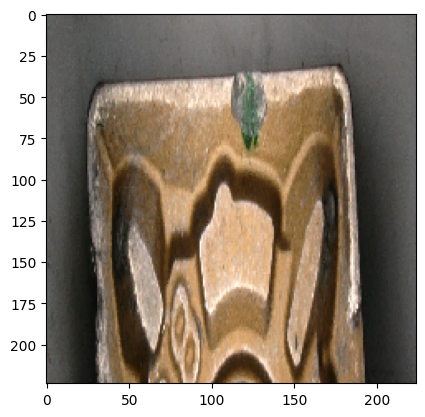

In [51]:
im = 5  # Define the index of the image to analyze

# Make predictions using the model
predictions = model.predict(test_image_batchmob[[im]])  # Get predictions for the selected image

print("Predicted Class Probabilities:", predictions)  # Print the predicted class probabilities
print("Class Names:", class_names)  # Print the names of the classes

# Print the predicted class index for the selected image
print("Predicted Class Index:",predicted_idtest1[im])

# Check if the predicted class is different from the true class
if predicted_idtest1[im] != label_idtest1[im]:
    print("\033[31mModel Prediction Class:", predicted_idtest1[im], "\033[0m")
    # If different, print the predicted class label in red
else:
    print("Model Prediction Class:", predicted_idtest1[im])
    # If the same, print the predicted class label

# Print the true class label for the selected image
print("True Class Label:", label_idtest1[im])

# Display the selected image
plt.imshow(image_batch[im])


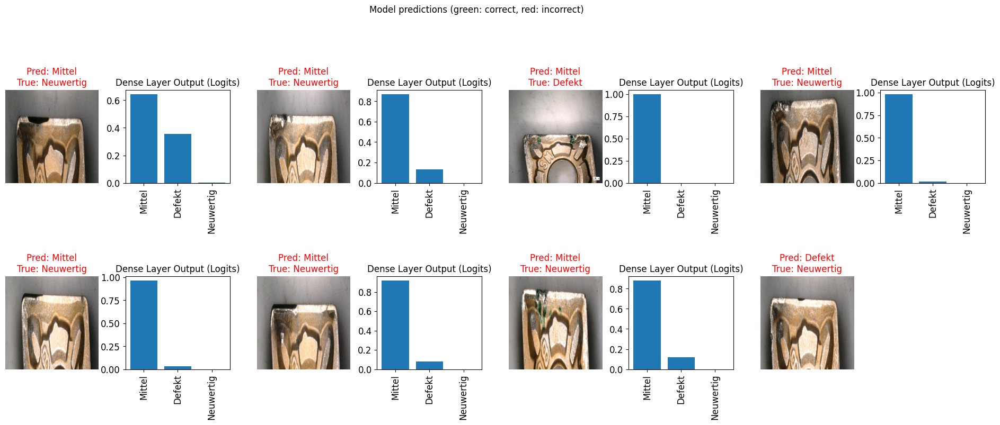

In [52]:
img_counter = 0  # Initialize a counter for iterating through images
prob_counter = 0  # Initialize a counter for iterating through probabilities

# Create a figure for plotting
plt.figure(figsize=(24, 16))
plt.subplots_adjust(hspace=1)  # Adjust spacing between subplots

# Loop to plot images and probability distributions for predictions
for n in range(15):
    plt.subplot(4, 8, n + 1)  # Create subplots in a 4x8 grid

    if n % 2 == 0:
        # Plot the test image
        plt.imshow(test_image_batchmob[img_counter])

        # Determine the color of the title based on prediction correctness
        color = "green" if predicted_idtest1[img_counter] == label_idtest1[img_counter] else "red"

        # Set the title with predicted and true labels
        # Map class indices to class names
        # Inside your loop, you can display class names using class_indices
        plt.title("Pred: " + class_names[predicted_idtest1[img_counter]].title() + "\nTrue: " + class_names[label_idtest1[img_counter]].title(), color=color)
        plt.axis('off')  # Turn off axis for the image
        _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")  # Super title for the entire plot

        img_counter += 1  # Increment the image counter

    if n % 2 == 1:
        # Title for the Dense Layer Output (Logits) plot
        plt.title("Dense Layer Output (Logits)", color="Black")

        # Extract the predicted probabilities for each class
        data = [predicted_batchtest1[prob_counter][0], predicted_batchtest1[prob_counter][1], predicted_batchtest1[prob_counter][2]]

        # Rotate x-axis labels vertically and adjust tick parameters
        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=12)

        # Create a bar plot to display the predicted probabilities
        plt.bar(class_names, data)

        prob_counter += 1  # Increment the probability counter

# The code above creates a visualization with images on the left and bar plots of predicted probabilities on the right.
# The titles of the images indicate whether the prediction is correct (green) or incorrect (red).
# The bar plots show the predicted probabilities for each class.


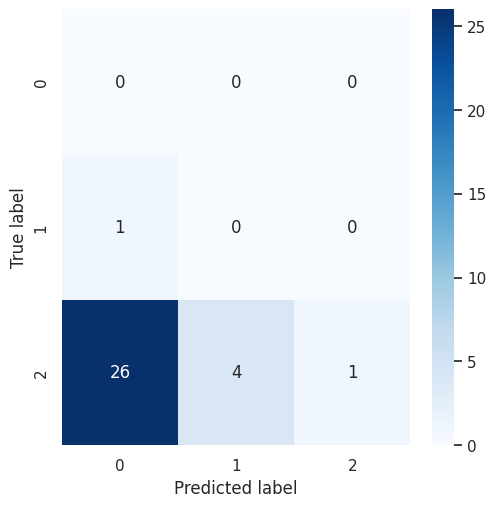

In [53]:
import matplotlib.pyplot as plt
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

con_mat_df=tf.math.confusion_matrix(labels =label_idtest1 , predictions = predicted_idtest1)
figure = plt.figure(figsize=(5, 5))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [54]:
from sklearn.metrics import classification_report
print(classification_report(label_idtest1, predicted_idtest1, zero_division=0))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00         1
           2       1.00      0.03      0.06        31

    accuracy                           0.03        32
   macro avg       0.33      0.01      0.02        32
weighted avg       0.97      0.03      0.06        32



In [55]:
#Define Number of Classes
NUM_CLASSES = 3

In [56]:
#Loading Pretrained ResNet50 Model
from keras import applications
base_model =applications.resnet50.ResNet50(weights= None, include_top=False, input_shape= (224,224,3))

In [57]:
# Define Top Layers for Custom Classification
x = base_model.output
# Global Average Pooling Layer
x = GlobalAveragePooling2D()(x)
# Dense Layer for Custom Classification
x = Dropout(0.7)(x)
# Final Output Layer
predictions = Dense(NUM_CLASSES, activation= 'softmax')(x)
# Create the Custom Model
model_2 = Model(inputs = base_model.input, outputs = predictions)

In [58]:
#Configures the model for training by specifying the optimization algorithm ('adam'), the loss function ('categorical_crossentropy'), and the evaluation metric ('accuracy').
from keras.optimizers import SGD, Adam
adam = Adam(lr=0.0001)
model_2.compile( optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_2 = model_2.fit(X_train, y_train, epochs=10, batch_size = 32, validation_data=(X_test, y_test))

Epoch 1/10
4/4 [==============================] - 121s 19s/step - loss: 2.1142 - accuracy: 0.5000 - val_loss: 0.9296 - val_accuracy: 0.7037
Epoch 2/10
4/4 [==============================] - 78s 18s/step - loss: 1.4478 - accuracy: 0.8148 - val_loss: 0.8452 - val_accuracy: 0.7037
Epoch 3/10
4/4 [==============================] - 78s 19s/step - loss: 0.7729 - accuracy: 0.7870 - val_loss: 0.8949 - val_accuracy: 0.7037
Epoch 4/10
4/4 [==============================] - 76s 18s/step - loss: 0.5545 - accuracy: 0.7593 - val_loss: 0.9566 - val_accuracy: 0.7037
Epoch 5/10
2/4 [==============>...............] - ETA: 39s - loss: 0.3602 - accuracy: 0.8594 

In [60]:
model_2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


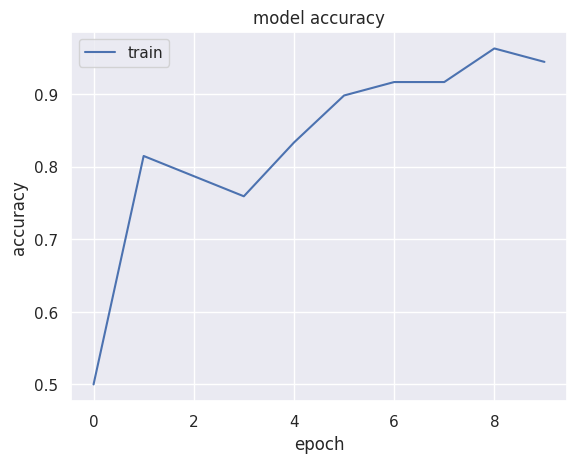

In [64]:
# Print the keys available in the history_2 object
print(history_2.history.keys())
plt.plot(history_2.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


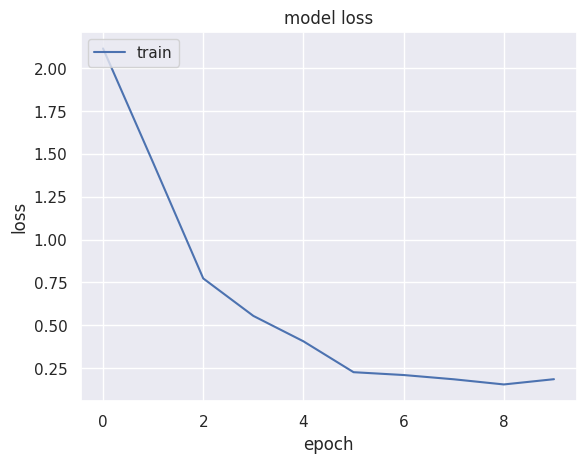

In [65]:
# summarize history for loss
# Print the keys available in the history_2 object
print(history_2.history.keys())

plt.plot(history_2.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

# Add a legend to the plot to differentiate between 'train' and 'validation'
# Specify the position of the legend in the 'upper left' corner

plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [66]:
# Make predictions using the model
predicted_batch2 = model_2.predict(X_train)
predicted_id2 = np.argmax(predicted_batch2, axis=-1)
predicted_label_batch2 = [class_names[i] for i in predicted_id2]
true_id2 = np.argmax(y_train, axis=-1)
true_label_batch2 = [class_names[i] for i in true_id2]
print("Predicted Labels:", predicted_label_batch2)
print("True Labels:", true_label_batch2)

4/4 [==============================] - 25s 5s/step
Predicted Labels: ['Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Defekt', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig

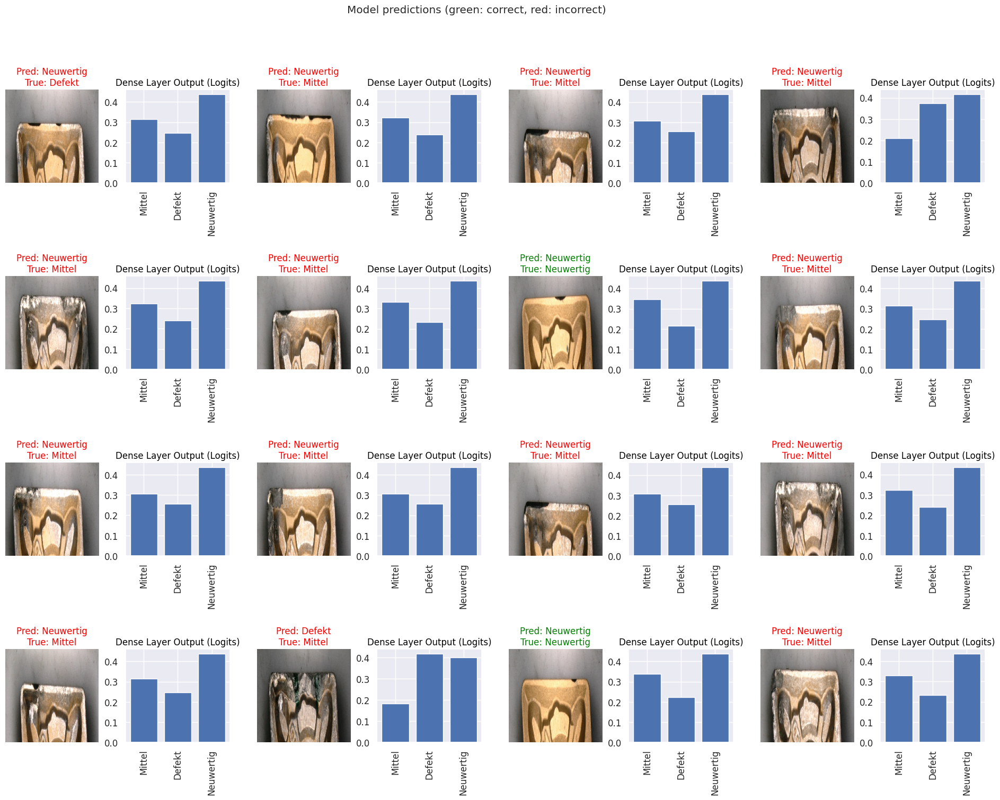

In [67]:
img_counter = 0
prob_counter = 0

plt.figure(figsize=(24, 16))
plt.subplots_adjust(hspace=1)
num_images = min(32, len(X_train))

for n in range(num_images):

    plt.subplot(4, 8, n + 1)
    if n % 2 == 0:
        plt.imshow(X_train[img_counter])
        color = "green" if predicted_id2[img_counter] == true_id2[img_counter] else "red"
        plt.title("Pred: " + predicted_label_batch2[img_counter].title() + "\nTrue: " + true_label_batch2[img_counter], color=color)
        plt.axis('off')
        _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")
        img_counter += 1

    if n % 2 == 1:
        plt.title("Dense Layer Output (Logits)", color="Black")
        data = [predicted_batch2[prob_counter][0], predicted_batch2[prob_counter][1], predicted_batch2[prob_counter][2]]
        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.bar(class_names, data)
        prob_counter += 1


In [82]:

test_data_generatorRES = image_generator.flow_from_directory("/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Test", target_size=IMAGE_SHAPE)
test_data_generatorRES.class_indices

Found 10 images belonging to 3 classes.


{'Defekt': 0, 'Mittel': 1, 'Neuwertig': 2}

In [84]:
for test_image_batchRES, test_label_batchRES in test_data_generatorRES :
  print("Image batch shape: ", test_image_batchRES.shape)
  print("Label batch shape: ", test_label_batchRES.shape)
  break

Image batch shape:  (10, 224, 224, 3)
Label batch shape:  (10, 3)


In [85]:
predicted_batchtest2 = model_2.predict(test_image_batchRES)
predicted_idtest2 = np.argmax(predicted_batchtest2, axis=-1)
label_idtest2 = np.argmax( test_label_batchRES, axis=-1)

1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 0s 347ms/step
Predicted Class Probabilities: [[0.3239252  0.23953624 0.4365386 ]]
Class Names: ['Mittel', 'Defekt', 'Neuwertig']
Predicted Class Index: 2
Model Prediction Class: 2 
True Class Label: 1


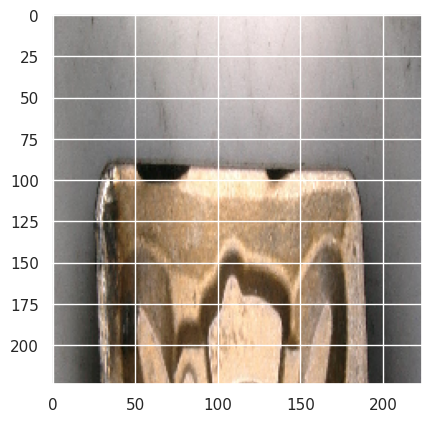

In [86]:
im = 3  # Define the index of the image to analyze

# Make predictions using the model
predictions = model_2.predict(test_image_batchRES[[im]])
print("Predicted Class Probabilities:", predictions)
print("Class Names:", class_names)

print("Predicted Class Index:", predicted_idtest2[im])
if predicted_idtest2[im] != label_idtest2[im]:
    print("\033[31mModel Prediction Class:", predicted_idtest2[im], "\033[0m")
else:
    print("Model Prediction Class:", predicted_idtest2[im])
print("True Class Label:",label_idtest2[im])
plt.imshow(test_image_batchRES[im])

In [87]:
class_names = ['Mittel', 'Defect', 'Neuwertig']

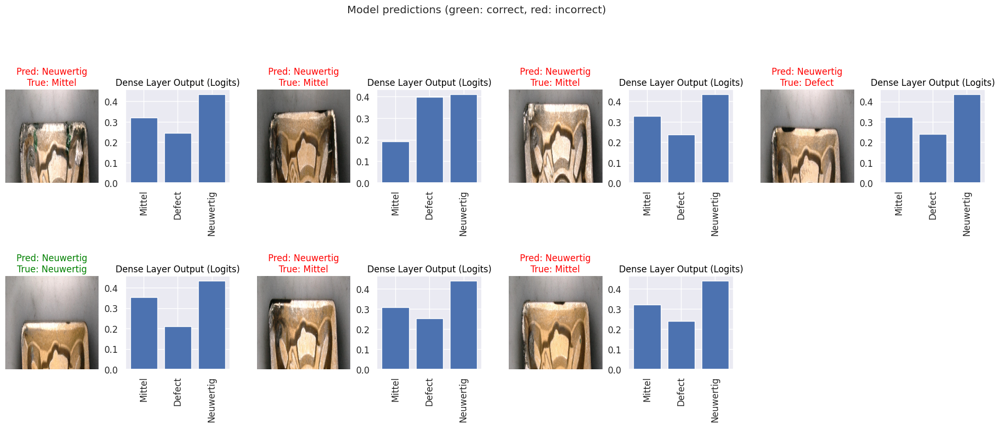

In [88]:
img_counter = 0
prob_counter = 0
plt.figure(figsize=(24, 16))
plt.subplots_adjust(hspace=1)

# Loop to plot images and probability distributions for predictions
for n in range(14):
    plt.subplot(4, 8, n + 1)
    if n % 2 == 0:
        plt.imshow(test_image_batchRES[img_counter])

        color = "green" if predicted_idtest2[img_counter] == label_idtest2[img_counter] else "red"
        plt.title("Pred: " + class_names[predicted_idtest2[img_counter]].title() + "\nTrue: " + class_names[label_idtest2[img_counter]].title(), color=color)
        plt.axis('off')
        _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")
        img_counter += 1

    if n % 2 == 1:
        plt.title("Dense Layer Output (Logits)", color="Black")
        data = [predicted_batchtest2[prob_counter][0], predicted_batchtest2[prob_counter][1], predicted_batchtest2[prob_counter][2]]

        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.bar(class_names, data)
        prob_counter += 1

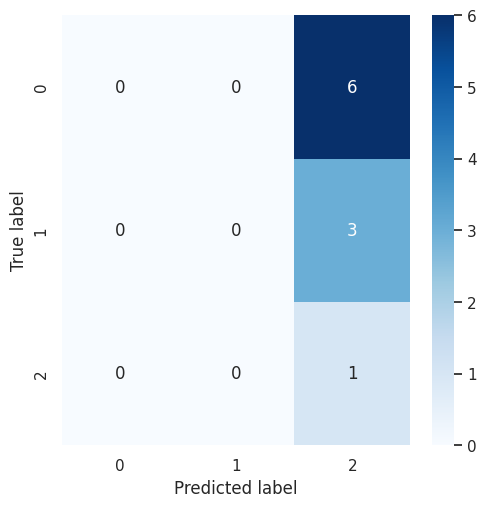

In [89]:
import matplotlib.pyplot as plt
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

con_mat_df=tf.math.confusion_matrix(predictions = predicted_idtest2, labels = label_idtest2)
figure = plt.figure(figsize=(5, 5))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [90]:
from sklearn.metrics import classification_report
print(classification_report(predicted_idtest2, label_idtest2,  zero_division=0))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00         0
           2       1.00      0.10      0.18        10

    accuracy                           0.10        10
   macro avg       0.33      0.03      0.06        10
weighted avg       1.00      0.10      0.18        10



In [91]:
# Define the ImageDataGenerator with augmentation parameters
Augmentationgenerator = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=5,         # Rotate the image by up to 10 degrees
    width_shift_range=0.05,     # Shift the width by up to 10% of the image's width
    height_shift_range=0.05,    # Shift the height by up to 10% of the image's height
    shear_range=0.05,          # Shear the image by up to 15 degrees
    zoom_range=0.05,            # Zoom in or out by up to 10%
    channel_shift_range=50.,  # Adjust color channels by up to 50
    horizontal_flip=True       # Flip the image horizontally
)

In [95]:
# Define the path to the directory containing the images for a specific class
chosen_image = random.choice(os.listdir('/content/ROI_images/Defekt'))
image_path = '/content/ROI_images/Defekt/' + chosen_image
image = np.expand_dims(plt.imread(image_path),0)
# Define the path to the directory where augmented images should be saved
aug_iterater = Augmentationgenerator.flow(image, save_to_dir='/content/ROI_images/Defekt', save_prefix='aug-image-', save_format='jpg')
# Now you can run the augmented image generation code
aug_images = [next(aug_iterater)[0].astype(np.uint8) for i in range(250)]

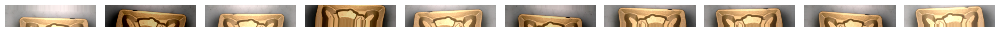

In [98]:
plotImages(aug_images)

In [97]:
chosen_image = random.choice(os.listdir('/content/ROI_images/Neuwertig'))
image_path = '/content/ROI_images/Neuwertig/' + chosen_image
image = np.expand_dims(plt.imread(image_path),0)
aug_iterater = Augmentationgenerator.flow(image, save_to_dir='/content/ROI_images/Neuwertig', save_prefix='aug-image-', save_format='jpg')
aug_images = [next(aug_iterater)[0].astype(np.uint8) for i in range(250)]

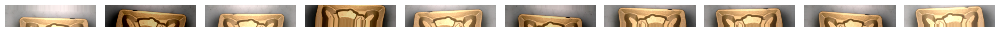

In [99]:
plotImages(aug_images)

In [100]:
# Define the desired image shape
IMAGE_SHAPE = (224, 224)
# Set the batch size for data processing during training
BATCH_SIZE = 32

In [101]:
# Create an ImageDataGenerator for data augmentation
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255,)
# Define the path to your training data directory
training_data_withaug = "/content/ROI_images"
# Create separate data generators for training and validation
train_dataaug_generator = image_generator.flow_from_directory(
    os.path.join(training_data_withaug),
    target_size=IMAGE_SHAPE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)


Found 632 images belonging to 3 classes.


In [102]:
total_images = train_dataaug_generator.samples
print(f"Total number of images: {total_images}")

Total number of images: 632


In [103]:
# Get a batch of data from the generator
image_batch, label_batch = next(train_dataaug_generator)
print("Image batch shape:", image_batch.shape)
print("Label batch shape:", label_batch.shape)

Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 3)


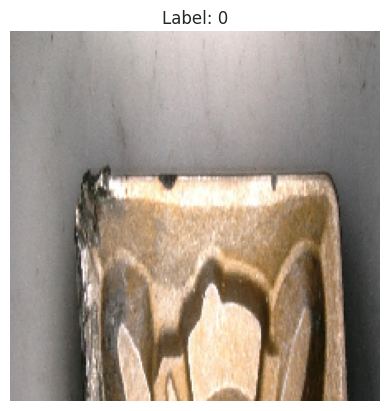

In [104]:
# Select a random index within the batch
index_to_display = random.randint(0, len(train_dataaug_generator) - 1)
selected_image_batch, selected_label_batch = train_dataaug_generator[index_to_display]
selected_image = selected_image_batch[0]
selected_label_index = np.argmax(selected_label_batch[0])
selected_label = selected_label_index

# Display the image and label
plt.imshow(selected_image)
plt.title(f"Label: {selected_label}")
plt.axis('off')
plt.show()



Class: Mittel


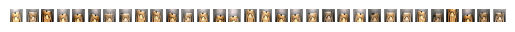

Class: Defect


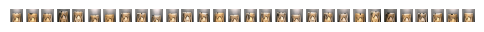

Class: Neuwertig


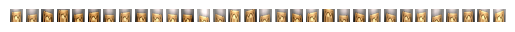

In [105]:
class_names = ['Mittel', 'Defect', 'Neuwertig']
examples_per_class = 32
class_images = {class_name: [] for class_name in class_names}

for i in range(len(train_dataaug_generator)):
    image_batch, label_batch = train_dataaug_generator[i]
    for j in range(len(label_batch)):
        label_index = np.argmax(label_batch[j])
        class_name = class_names[label_index]
        if len(class_images[class_name]) < examples_per_class:
            class_images[class_name].append(image_batch[j])


for class_name, images in class_images.items():
    print(f"Class: {class_name}")
    for i, image in enumerate(images):
        plt.subplot(len(class_names), examples_per_class, i + 1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()


In [108]:
# Create a dictionary to store the counts for each class
class_counts = {class_name: 0 for class_name in class_names}

# Iterate through the data generator to count the images per class
for i in range(len(train_dataaug_generator)):
    _, label_batch = train_dataaug_generator[i]
    for j in range(len(label_batch)):
        label_index = np.argmax(label_batch[j])
        class_name = class_names[label_index]
        class_counts[class_name] += 1

# Print the total number of images in each class
for class_name, count in class_counts.items():
    print(f"Class: {class_name}, Total Images: {count}")

Class: Mittel, Total Images: 352
Class: Defect, Total Images: 30
Class: Neuwertig, Total Images: 250


In [109]:
# Define the number of batches to consider for splitting
num_batches = len(train_dataaug_generator)

# Initialize empty lists to store images and labels
images = []
labels = []

# Load all batches from the generator into lists
for _ in range(num_batches):
    image_batch, label_batch = next(train_dataaug_generator)
    images.append(image_batch)
    labels.append(label_batch)

# Convert the lists to NumPy arrays
X = np.vstack(images)
y = np.vstack(labels)

# Split the data into training and test sets
X_trainaug, X_testaug, y_trainaug, y_testaug = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the sizes of the training and test sets
print(f"Training set size: {len(X_train)} images")
print(f"Test set size: {len(X_test)} images")


Training set size: 108 images
Test set size: 27 images


In [110]:
print(X_trainaug.shape)
print(X_testaug.shape)
print(y_trainaug.shape)
print(y_testaug.shape)

(505, 224, 224, 3)
(127, 224, 224, 3)
(505, 3)
(127, 3)


In [111]:
model_3 = tf.keras.Sequential([feature_extractor ])
model_3.add(tf.keras.layers.Dense(3, activation='softmax'))
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense_2 (Dense)             (None, 3)                 3843      
                                                                 
Total params: 2261827 (8.63 MB)
Trainable params: 3843 (15.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [112]:
model_3.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'] )

In [113]:
# Train the model using training data and validation data
history_1withaug = model_3.fit(X_trainaug, y_trainaug, epochs=10 , validation_data=(X_testaug, y_testaug))

Epoch 1/10
16/16 [==============================] - 25s 1s/step - loss: 1.1541 - accuracy: 0.5287 - val_loss: 0.5074 - val_accuracy: 0.8661
Epoch 2/10
16/16 [==============================] - 17s 1s/step - loss: 0.3303 - accuracy: 0.9228 - val_loss: 0.2340 - val_accuracy: 0.9606
Epoch 3/10
16/16 [==============================] - 18s 1s/step - loss: 0.1920 - accuracy: 0.9485 - val_loss: 0.1655 - val_accuracy: 0.9370
Epoch 4/10
16/16 [==============================] - 18s 1s/step - loss: 0.1514 - accuracy: 0.9505 - val_loss: 0.1463 - val_accuracy: 0.9528
Epoch 5/10
16/16 [==============================] - 15s 985ms/step - loss: 0.1285 - accuracy: 0.9545 - val_loss: 0.1224 - val_accuracy: 0.9685
Epoch 6/10
16/16 [==============================] - 16s 993ms/step - loss: 0.1210 - accuracy: 0.9525 - val_loss: 0.1223 - val_accuracy: 0.9685
Epoch 7/10
16/16 [==============================] - 16s 1s/step - loss: 0.1095 - accuracy: 0.9584 - val_loss: 0.1235 - val_accuracy: 0.9606
Epoch 8/10
16/

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


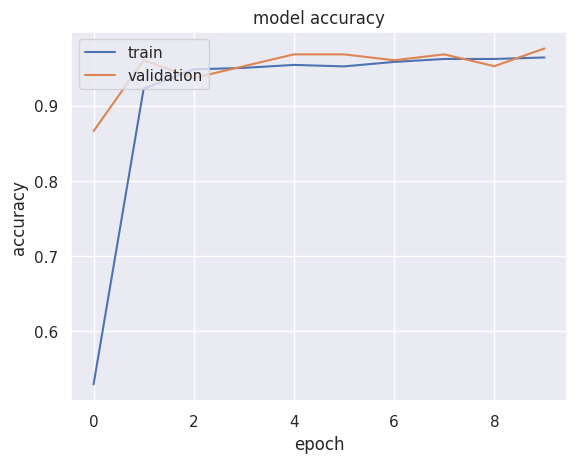

In [114]:
print(history_1withaug.history.keys())
# summarize history for accuracy
plt.plot(history_1withaug.history['accuracy'])
plt.plot(history_1withaug.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


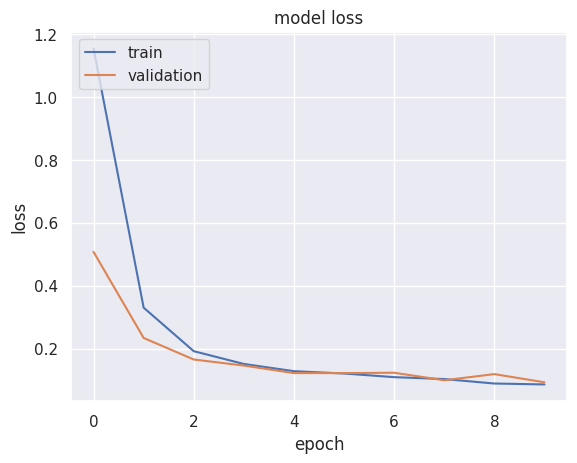

In [115]:
# summarize history for loss
plt.plot(history_1withaug.history['loss'])
plt.plot(history_1withaug.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [116]:
# Make predictions using the model
predicted_batch3 = model_3.predict(X_trainaug)
predicted_id3 = np.argmax(predicted_batch3, axis=-1)
predicted_label_batch3 = [class_names[i] for i in predicted_id3]
true_id3 = np.argmax(y_trainaug, axis=-1)
true_label_batch3 = [class_names[i] for i in true_id3]

# Now you can print the predicted and true labels for the batch
print("Predicted Labels:", predicted_label_batch3)
print("True Labels:", true_label_batch3)

16/16 [==============================] - 16s 927ms/step
Predicted Labels: ['Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Neuwertig', 'Defect', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Defect', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Defect', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Mitt

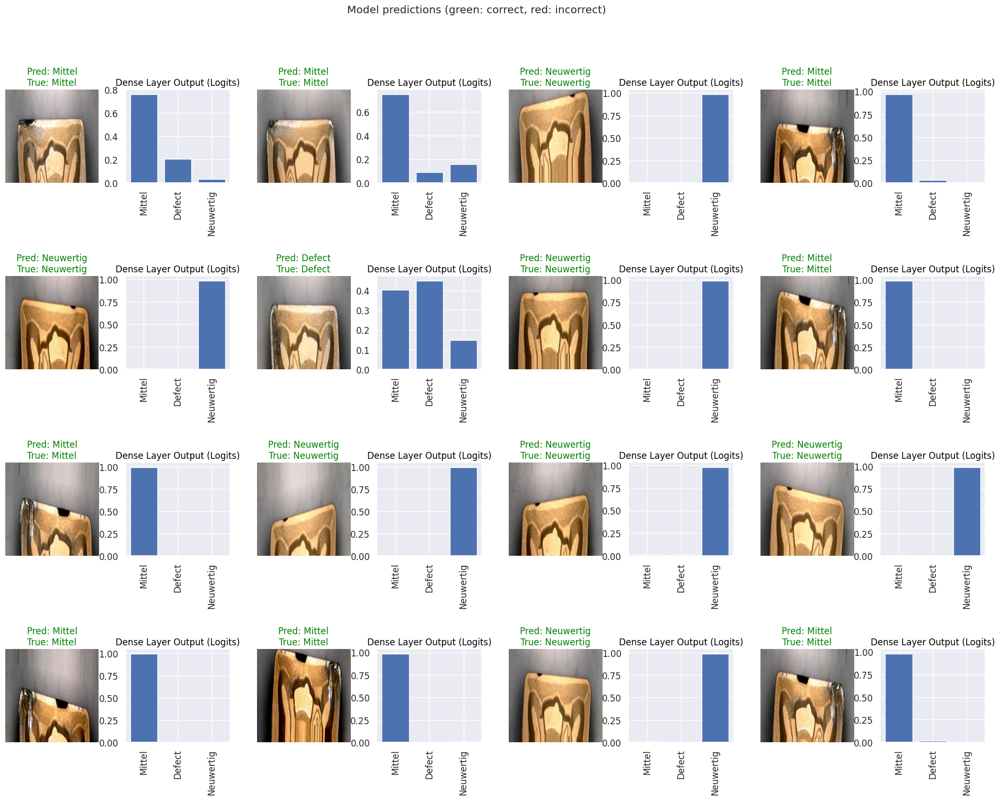

In [117]:
img_counter=0
prob_counter=0

plt.figure(figsize=(24,16))
plt.subplots_adjust(hspace=1)
# Loop to plot images and probability distributions for predictions
for n in range(32):
  plt.subplot(4,8,n+1)
  if(n%2==0):
      plt.imshow(X_trainaug[img_counter])
      color = "green" if predicted_id3[img_counter] == true_id3[img_counter] else "red"
      plt.title("Pred: "+predicted_label_batch3[img_counter].title()+"\nTrue: "+true_label_batch3[img_counter], color=color)
      plt.axis('off')
      _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")
      img_counter=img_counter+1

  if(n%2==1):
      plt.title("Dense Layer Output (Logits)", color="Black")

      data=[predicted_batch3[prob_counter][0],predicted_batch3[prob_counter][1],predicted_batch3[prob_counter][2]]
      classes=['Container_Groß','Container_Klein', 'Lader']
      plt.xticks(rotation='vertical',)
      plt.tick_params(axis='both', which='major', labelsize=12)

      plt.bar(class_names,data)
      prob_counter=prob_counter+1

In [119]:
# Create an ImageDataGenerator for data augmentation
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255,)
# Define the path to your training data directory
testing_data_MobAug = "/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Test"
# Create separate data generators for training and validation
test_data_generator_MobAug = image_generator.flow_from_directory(testing_data_MobAug, target_size=IMAGE_SHAPE)

Found 10 images belonging to 3 classes.


In [120]:
for test_image_batch_MobAug, test_label_batch_MobAug in test_data_generator_MobAug :
  print("Image batch shape: ", test_image_batch_MobAug.shape)
  print("Label batch shape: ", test_label_batch_MobAug.shape)
  break

Image batch shape:  (10, 224, 224, 3)
Label batch shape:  (10, 3)


In [121]:
predicted_batch_MobAug = model_3.predict(test_image_batch_MobAug)
predicted_id_MobAug = np.argmax(predicted_batch_MobAug, axis=-1)
label_id_MobAug = np.argmax( test_label_batch_MobAug, axis=-1)

1/1 [==============================] - 1s 713ms/step


1/1 [==============================] - 0s 61ms/step
Predicted Class Probabilities: [[0.         0.05729507 0.15287529 ... 1.8194615  0.11160077 0.28296953]]
Class Names: ['Mittel', 'Defect', 'Neuwertig']
Predicted Class Index: 1
Model Prediction Class: 1
True Class Label: 1


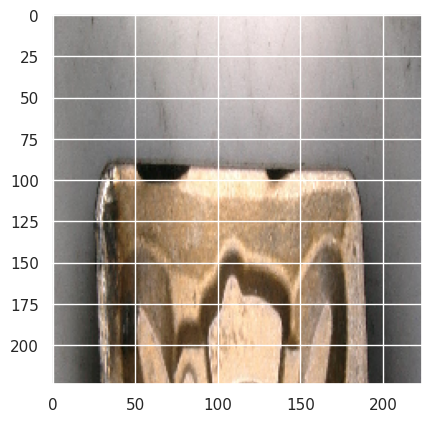

In [122]:
im = 5  # Define the index of the image to analyze

predictions_MobAug = model.predict(test_image_batch_MobAug[[im]])
print("Predicted Class Probabilities:", predictions_MobAug)
print("Class Names:", class_names)
print("Predicted Class Index:", predicted_id_MobAug[im])


if predicted_id_MobAug[im] != label_id_MobAug[im]:
    print("\033[31mModel Prediction Class:", predicted_id_MobAug[im], "\033[0m")
else:
    print("Model Prediction Class:",predicted_id_MobAug[im])

print("True Class Label:",label_id_MobAug[im])
# Display the selected image
plt.imshow((test_image_batch_MobAug[im]))


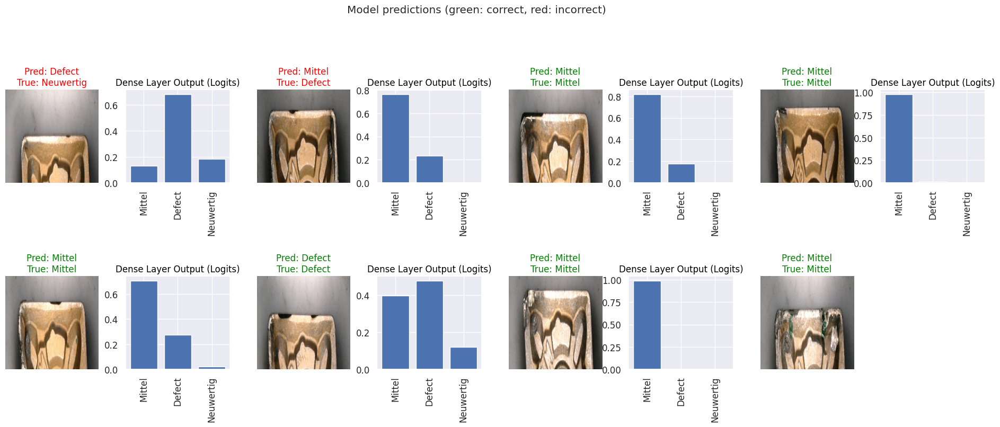

In [123]:
img_counter = 0
prob_counter = 0

# Create a figure for plotting
plt.figure(figsize=(24, 16))
plt.subplots_adjust(hspace=1)

# Loop to plot images and probability distributions for predictions
for n in range(15):
    plt.subplot(4, 8, n + 1)

    if n % 2 == 0:
        plt.imshow(test_image_batch_MobAug[img_counter])

        color = "green" if predicted_id_MobAug[img_counter] == label_id_MobAug[img_counter] else "red"
        plt.title("Pred: " + class_names[predicted_id_MobAug[img_counter]].title() + "\nTrue: " + class_names[label_id_MobAug[img_counter]].title(), color=color)
        plt.axis('off')
        _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")

        img_counter += 1

    if n % 2 == 1:
        plt.title("Dense Layer Output (Logits)", color="Black")
        data = [predicted_batch_MobAug[prob_counter][0], predicted_batch_MobAug[prob_counter][1], predicted_batch_MobAug[prob_counter][2]]


        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.bar(class_names, data)
        prob_counter += 1




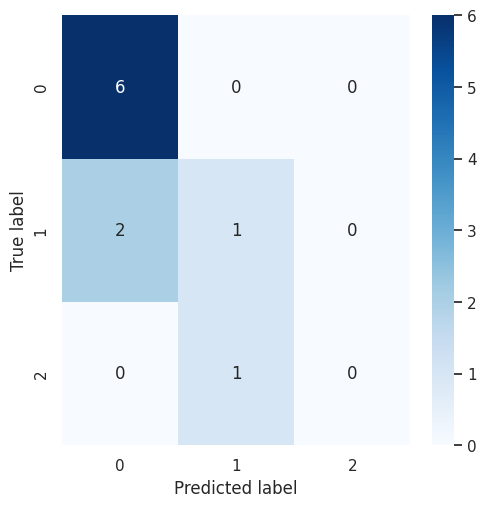

In [125]:
import matplotlib.pyplot as plt
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

con_mat_df=tf.math.confusion_matrix(labels = label_id_MobAug , predictions = predicted_id_MobAug)
figure = plt.figure(figsize=(5, 5))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [126]:
from sklearn.metrics import classification_report
print(classification_report(label_id_MobAug, predicted_id_MobAug, zero_division=0))

              precision    recall  f1-score   support

           0       0.75      1.00      0.86         6
           1       0.50      0.33      0.40         3
           2       0.00      0.00      0.00         1

    accuracy                           0.70        10
   macro avg       0.42      0.44      0.42        10
weighted avg       0.60      0.70      0.63        10



In [127]:
#Define Number of Classes
NUM_CLASSES = 3

In [128]:
# Define Top Layers for Custom Classification
x = base_model.output
# Global Average Pooling Layer
x = GlobalAveragePooling2D()(x)
# Dense Layer for Custom Classification
x = Dropout(0.7)(x)
# Final Output Layer
predictions = Dense(NUM_CLASSES, activation= 'softmax')(x)
# Create the Custom Model
model_4 = Model(inputs = base_model.input, outputs = predictions)

In [129]:
#Configures the model for training by specifying the optimization algorithm ('adam'), the loss function ('categorical_crossentropy'), and the evaluation metric ('accuracy').
from keras.optimizers import SGD, Adam
adam = Adam(lr=0.0001)
model_4.compile( optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [130]:
history_4 = model_4.fit(X_trainaug, y_trainaug, epochs=10, validation_data=(X_testaug, y_testaug))

Epoch 1/10
16/16 [==============================] - 381s 22s/step - loss: 1.1558 - accuracy: 0.7683 - val_loss: 356.7742 - val_accuracy: 0.5827
Epoch 2/10
16/16 [==============================] - 366s 23s/step - loss: 0.3762 - accuracy: 0.9069 - val_loss: 885.7476 - val_accuracy: 0.5827
Epoch 3/10
16/16 [==============================] - 370s 23s/step - loss: 0.2822 - accuracy: 0.9327 - val_loss: 22.3113 - val_accuracy: 0.5197
Epoch 4/10
16/16 [==============================] - 343s 21s/step - loss: 0.2021 - accuracy: 0.9347 - val_loss: 89.4955 - val_accuracy: 0.3780
Epoch 5/10
16/16 [==============================] - 340s 21s/step - loss: 0.2542 - accuracy: 0.9267 - val_loss: 93.0209 - val_accuracy: 0.3780
Epoch 6/10
16/16 [==============================] - 352s 22s/step - loss: 0.1866 - accuracy: 0.9386 - val_loss: 129.6923 - val_accuracy: 0.3780
Epoch 7/10
16/16 [==============================] - 366s 23s/step - loss: 0.2153 - accuracy: 0.9228 - val_loss: 49.8507 - val_accuracy: 0.3

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


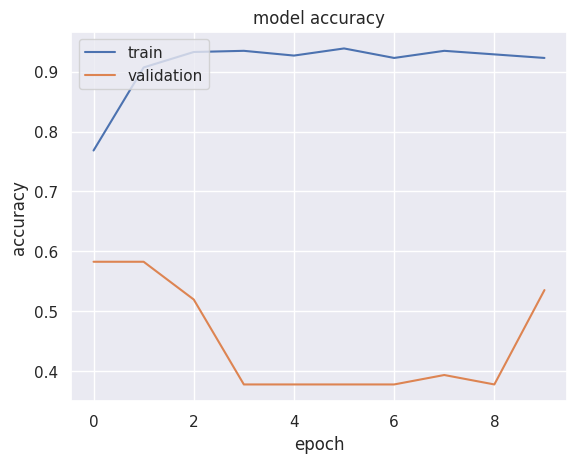

In [131]:
# Print the keys available in the history_2 object

print(history_4.history.keys())
plt.plot(history_4.history['accuracy'])
plt.plot(history_4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

# Display the accuracy plot on the screen
plt.show()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


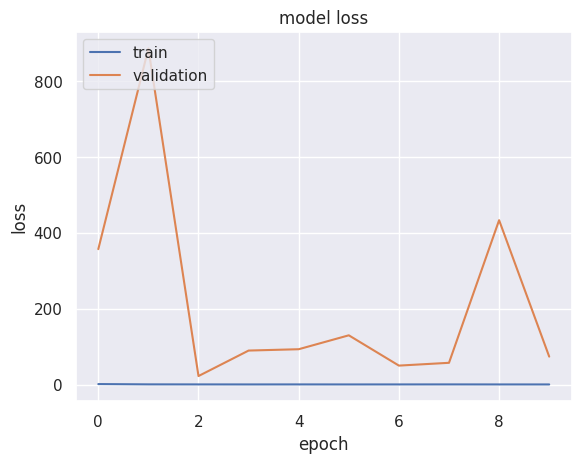

In [132]:
# summarize history for loss
# Print the keys available in the history_2 object
print(history_4.history.keys())

plt.plot(history_4.history['loss'])
plt.plot(history_4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

# Add a legend to the plot to differentiate between 'train' and 'validation'
# Specify the position of the legend in the 'upper left' corner

plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [133]:
# Make predictions using the model
predicted_batch_ResAug = model_4.predict(X_trainaug)
predicted_id_ResAug = np.argmax(predicted_batch_ResAug, axis=-1)
predicted_label_batch_ResAug = [class_names[i] for i in predicted_id_ResAug]
true_id_ResAug = np.argmax(y_trainaug, axis=-1)
true_label_batch_ResAug = [class_names[i] for i in true_id_ResAug]

# Now you can print the predicted and true labels for the batch
print("Predicted Labels:", predicted_label_batch_ResAug)
print("True Labels:", true_label_batch_ResAug)

16/16 [==============================] - 95s 6s/step
Predicted Labels: ['Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Mittel', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neuwertig', 'Neuwertig', 'Mittel', 'Mittel', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Neuwertig', 'Mittel', 'Neu

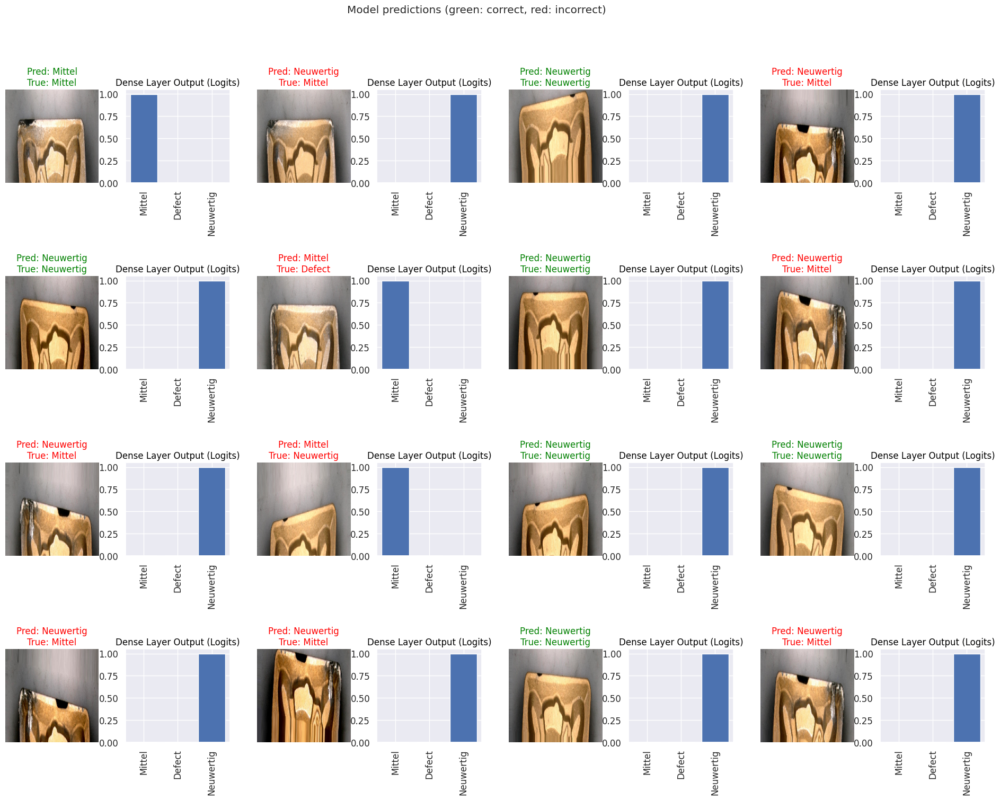

In [134]:
img_counter = 0
prob_counter = 0

plt.figure(figsize=(24, 16))
plt.subplots_adjust(hspace=1)
num_images = min(32, len((X_trainaug)))  # Ensure you don't exceed the available images

for n in range(num_images):

    plt.subplot(4, 8, n + 1)
    if n % 2 == 0:
        plt.imshow(X_trainaug[img_counter])
        color = "green" if predicted_id_ResAug[img_counter] == true_id_ResAug[img_counter] else "red"
        plt.title("Pred: " + predicted_label_batch_ResAug[img_counter].title() + "\nTrue: " + true_label_batch_ResAug[img_counter], color=color)
        plt.axis('off')
        _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")
        img_counter += 1

    if n % 2 == 1:
        plt.title("Dense Layer Output (Logits)", color="Black")
        data = [predicted_batch_ResAug[prob_counter][0], predicted_batch_ResAug[prob_counter][1], predicted_batch_ResAug[prob_counter][2]]
        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.bar(class_names, data)
        prob_counter += 1


In [136]:
# Define the path to your training data directory
testing_data_ResAug = "/content/drive/MyDrive/Datensatz Seminararbeit WS23-24/Test"

# Create separate data generators for training and validation
test_data_generator_ResAug = image_generator.flow_from_directory(testing_data_ResAug, target_size=IMAGE_SHAPE)

Found 10 images belonging to 3 classes.


In [137]:
for test_image_batch_ResAug, test_label_batch_ResAug in test_data_generator_ResAug :
  print("Image batch shape: ", test_image_batch_ResAug.shape)
  print("Label batch shape: ", test_label_batch_ResAug.shape)
  break

Image batch shape:  (10, 224, 224, 3)
Label batch shape:  (10, 3)


In [138]:
predicted_batch_testResAug = model_4.predict(test_image_batch_ResAug)
predicted_id_testResAug = np.argmax(predicted_batch_testResAug, axis=-1)
label_id_testResAug = np.argmax( test_label_batch_ResAug, axis=-1)

1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 0s 49ms/step
Predicted Class Probabilities: [[0.11536013 0.06153936 0.76584315 ... 1.9394672  0.05056859 0.7250655 ]]
Class Names: ['Mittel', 'Defect', 'Neuwertig']
Predicted Class Index: 2
Model Prediction Class: 2 
True Class Label: 1


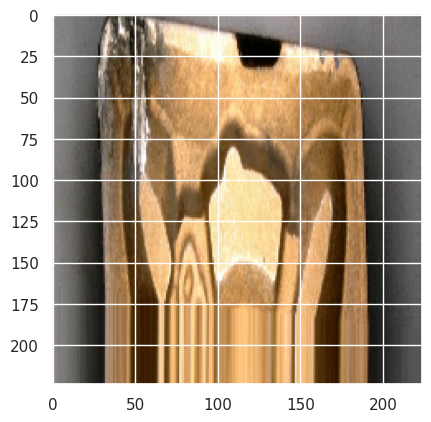

In [139]:
im = 1  # Define the index of the image to analyze

# Make predictions using the model
predictions_ResAug = model.predict(test_image_batch_ResAug [[im]])  # Get predictions for the selected image

print("Predicted Class Probabilities:", predictions_ResAug )  # Print the predicted class probabilities
print("Class Names:", class_names)  # Print the names of the classes

# Print the predicted class index for the selected image
print("Predicted Class Index:", predicted_id_ResAug [im])

# Check if the predicted class is different from the true class
if predicted_id_testResAug[im] !=label_id_testResAug[im]:
    print("\033[31mModel Prediction Class:", predicted_id_testResAug[im], "\033[0m")
    # If different, print the predicted class label in red
else:
    print("Model Prediction Class:", predicted_id_testResAug[im])
    # If the same, print the predicted class label

# Print the true class label for the selected image
print("True Class Label:", label_id_testResAug[im])

# Display the selected image
plt.imshow(image_batch[im])

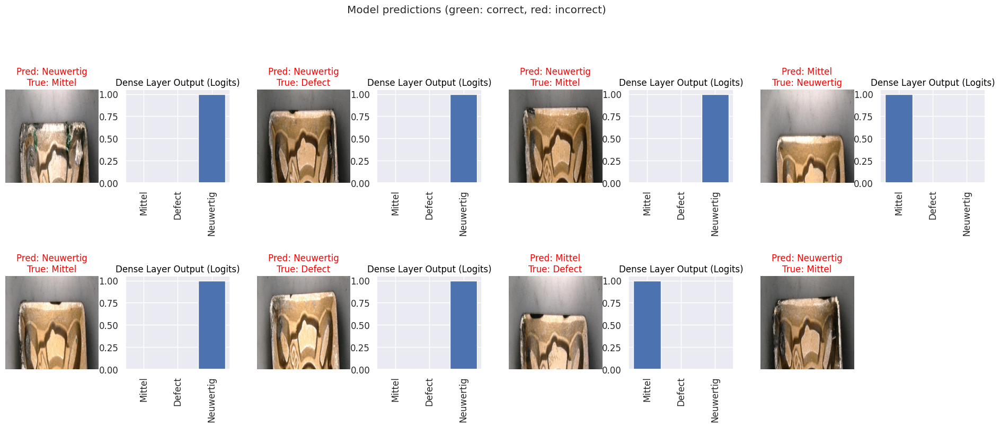

In [140]:
img_counter = 0
prob_counter = 0
plt.figure(figsize=(24, 16))
plt.subplots_adjust(hspace=1)


for n in range(15):
    plt.subplot(4, 8, n + 1)

    if n % 2 == 0:
        plt.imshow(test_image_batch_ResAug[img_counter])
        color = "green" if predicted_id_testResAug[img_counter] == label_id_testResAug[img_counter] else "red"
        plt.title("Pred: " + class_names[predicted_id_testResAug[img_counter]].title() + "\nTrue: " + class_names[label_id_testResAug[img_counter]].title(), color=color)
        plt.axis('off')
        _ = plt.suptitle("Model predictions (green: correct, red: incorrect)")  # Super title for the entire plot
        img_counter += 1

    if n % 2 == 1:
        plt.title("Dense Layer Output (Logits)", color="Black")

        data = [predicted_batch_testResAug[prob_counter][0],predicted_batch_testResAug[prob_counter][1],predicted_batch_testResAug[prob_counter][2]]

        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.bar(class_names, data)
        prob_counter += 1



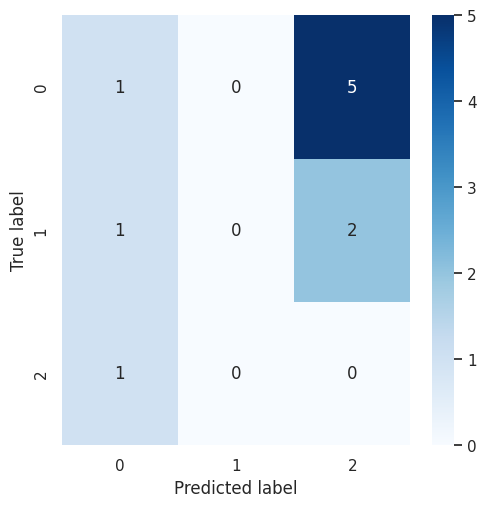

In [141]:
import matplotlib.pyplot as plt
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

con_mat_df=tf.math.confusion_matrix(labels = label_id_testResAug , predictions = predicted_id_testResAug )
figure = plt.figure(figsize=(5, 5))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [142]:
from sklearn.metrics import classification_report
print(classification_report(label_id_testResAug, predicted_id_testResAug, zero_division=0))

              precision    recall  f1-score   support

           0       0.33      0.17      0.22         6
           1       0.00      0.00      0.00         3
           2       0.00      0.00      0.00         1

    accuracy                           0.10        10
   macro avg       0.11      0.06      0.07        10
weighted avg       0.20      0.10      0.13        10

